### Seminar 6. Object detection  
[Source](https://github.com/open-mmlab/mmdetection/blob/master/demo/MMDet_Tutorial.ipynb)

In this seminar we look at the implementation of Object Detection using [MMDetection library](https://mmdetection.readthedocs.io/en/latest/)

Installing MMDetection

In [ ]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

Loading pretrained model

In [ ]:
!mkdir checkpoints
!wget https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r101_fpn_mstrain_3x_coco/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth -O checkpoints/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-09-22 12:22:53--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r101_fpn_mstrain_3x_coco/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.89.140.65
Connecting to download.openmmlab.com (download.openmmlab.com)|47.89.140.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 243519108 (232M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth’

checkpoints/faster_ 100%[===================>] 232.24M  8.29MB/s    in 25s     

2022-09-22 12:23:18 (9.13 MB/s) - ‘checkpoints/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth’ saved [243519108/243519108]



Initializing object detection model

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_r101_fpn_mstrain_3x_coco.py'
# Setup a checkpoint file to load
checkpoint = '/content/mmdetection/checkpoints/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device);
# Convert the model into evaluation mode
model.eval()

Making predictions

In [ ]:
# Use the detector to do inference
img = 'demo/demo.jpg'
result = inference_detector(model, img)

/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


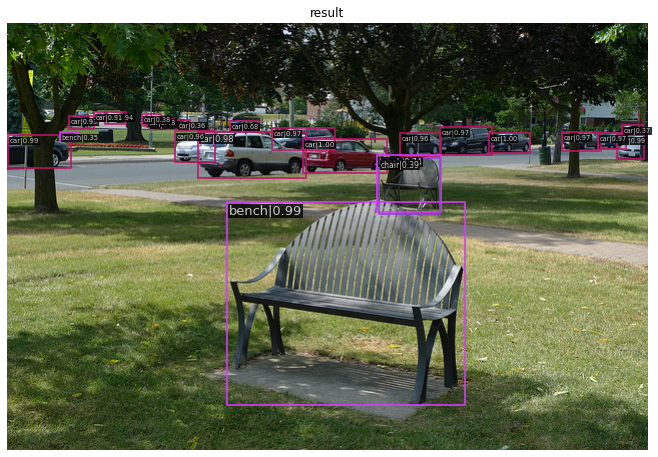

In [ ]:
# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.3)

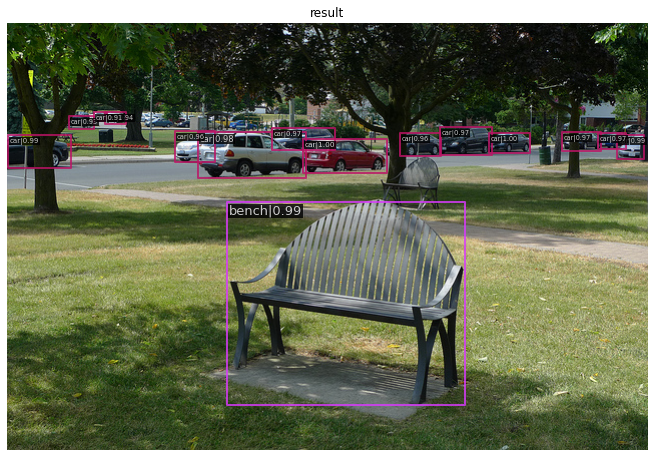

In [ ]:
# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.9)

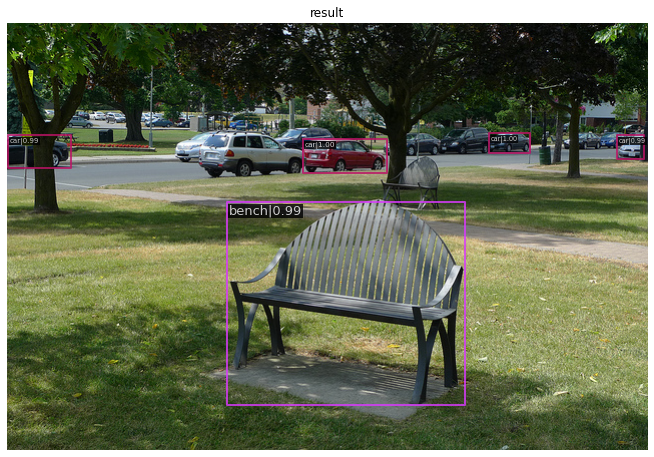

In [ ]:
# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.99)

Uploading your image

In [ ]:
from google.colab import files
from IPython.display import Image

In [ ]:
uploaded = files.upload()

Saving roasting_phd.png to roasting_phd.png


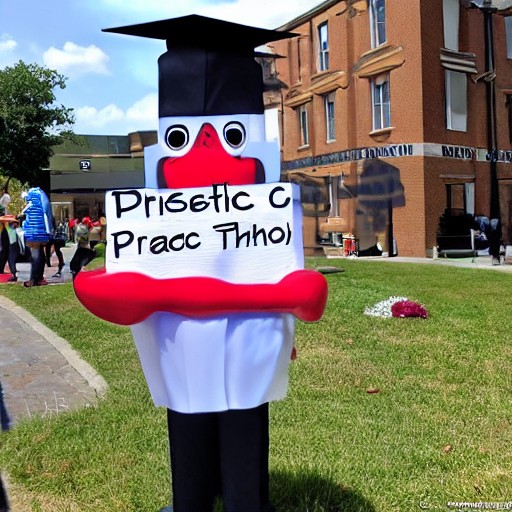

In [ ]:
Image('roasting_phd.png', width=512)

In [ ]:
result = inference_detector(model, 'roasting_phd.png')

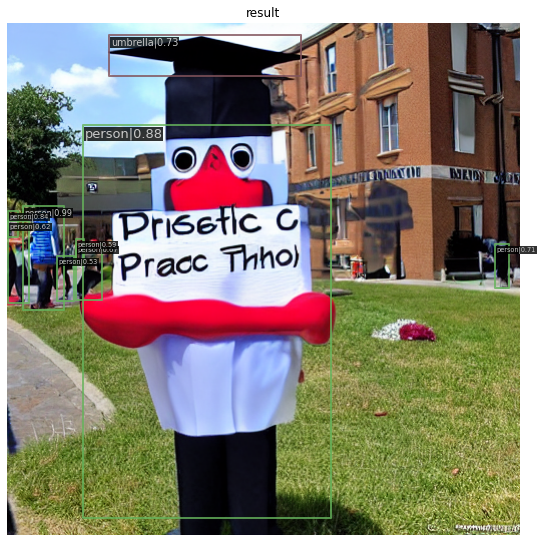

In [ ]:
# Let's plot the result
show_result_pyplot(model, 'roasting_phd.png', result, score_thr=0.5)

### Training on new dataset

In [ ]:
!wget https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
!unzip kitti_tiny.zip > /dev/null

--2022-09-22 12:46:31--  https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
Resolving download.openmmlab.com (download.openmmlab.com)... 47.89.140.65
Connecting to download.openmmlab.com (download.openmmlab.com)|47.89.140.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6918271 (6.6M) [application/zip]
Saving to: ‘kitti_tiny.zip’

kitti_tiny.zip      100%[===================>]   6.60M  8.59MB/s    in 0.8s    

2022-09-22 12:46:32 (8.59 MB/s) - ‘kitti_tiny.zip’ saved [6918271/6918271]



In [ ]:
# Install tree first
!apt-get -q install tree
!tree kitti_tiny

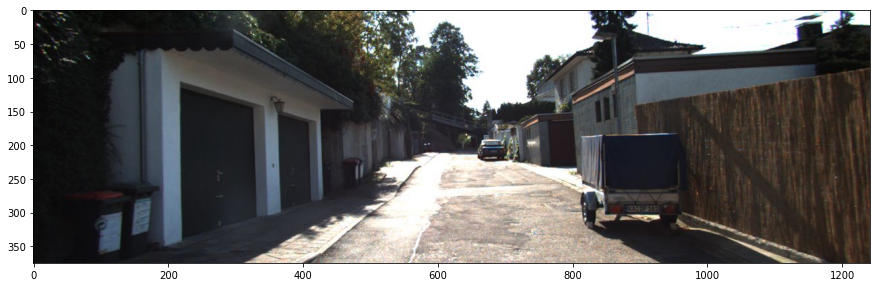

In [ ]:
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('kitti_tiny/training/image_2/000002.jpeg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [ ]:
# Check the label of a single image
!cat kitti_tiny/training/label_2/000001.txt

Truck 0.00 0 -1.57 599.41 156.40 629.75 189.25 2.85 2.63 12.34 0.47 1.49 69.44 -1.56
Car 0.00 0 1.85 387.63 181.54 423.81 203.12 1.67 1.87 3.69 -16.53 2.39 58.49 1.57
Cyclist 0.00 3 -1.65 676.60 163.95 688.98 193.93 1.86 0.60 2.02 4.59 1.32 45.84 -1.55
DontCare -1 -1 -10 503.89 169.71 590.61 190.13 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 511.35 174.96 527.81 187.45 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 532.37 176.35 542.68 185.27 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 559.62 175.83 575.40 183.15 -1 -1 -1 -1000 -1000 -1000 -10


According to the KITTI's documentation, the first column indicates the class of the object, and the 5th to 8th columns indicate the bboxes. We need to read annotations of each image and convert them into middle format that MMDetection can accept, as follows:

```python
[
    {
        'filename': 'a.jpg',
        'width': 1280,
        'height': 720,
        'ann': {
            'bboxes': <np.ndarray> (n, 4) in (x1, y1, x2, y2) order,
            'labels': <np.ndarray> (n, ),
            'bboxes_ignore': <np.ndarray> (k, 4), (optional field)
            'labels_ignore': <np.ndarray> (k, 4) (optional field)
        }
    },
    ...
]
```

In [ ]:
import copy
import os.path as osp

import mmcv
import numpy as np

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset

@DATASETS.register_module()
class KittiTinyDataset(CustomDataset):

    CLASSES = ('Car', 'Pedestrian', 'Cyclist')

    def load_annotations(self, ann_file):
        cat2label = {k: i for i, k in enumerate(self.CLASSES)}
        # load image list from file
        image_list = mmcv.list_from_file(self.ann_file)
    
        data_infos = []
        # convert annotations to middle format
        for image_id in image_list:
            filename = f'{self.img_prefix}/{image_id}.jpeg'
            image = mmcv.imread(filename)
            height, width = image.shape[:2]
    
            data_info = dict(filename=f'{image_id}.jpeg', width=width, height=height)
    
            # load annotations
            label_prefix = self.img_prefix.replace('image_2', 'label_2')
            lines = mmcv.list_from_file(osp.join(label_prefix, f'{image_id}.txt'))
    
            content = [line.strip().split(' ') for line in lines]
            bbox_names = [x[0] for x in content]
            bboxes = [[float(info) for info in x[4:8]] for x in content]
    
            gt_bboxes = []
            gt_labels = []
            gt_bboxes_ignore = []
            gt_labels_ignore = []
    
            # filter 'DontCare'
            for bbox_name, bbox in zip(bbox_names, bboxes):
                if bbox_name in cat2label:
                    gt_labels.append(cat2label[bbox_name])
                    gt_bboxes.append(bbox)
                else:
                    gt_labels_ignore.append(-1)
                    gt_bboxes_ignore.append(bbox)

            data_anno = dict(
                bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
                labels=np.array(gt_labels, dtype=np.long),
                bboxes_ignore=np.array(gt_bboxes_ignore,
                                       dtype=np.float32).reshape(-1, 4),
                labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

            data_info.update(ann=data_anno)
            data_infos.append(data_info)

        return data_infos

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/faster_rcnn/faster_rcnn_r101_fpn_mstrain_3x_coco.py')
# /content/mmdetection/configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py
# faster_rcnn_r101_fpn_mstrain_3x_coco.py

In [ ]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'KittiTinyDataset'
cfg.data_root = 'kitti_tiny/'

cfg.data.test.type = 'KittiTinyDataset'
cfg.data.test.data_root = 'kitti_tiny/'
cfg.data.test.ann_file = 'train.txt'
cfg.data.test.img_prefix = 'training/image_2'

cfg.data.train.type = 'KittiTinyDataset'
cfg.data.train.data_root = 'kitti_tiny/'
cfg.data.train.ann_file = 'train.txt'
cfg.data.train.img_prefix = 'training/image_2'

cfg.data.val.type = 'KittiTinyDataset'
cfg.data.val.data_root = 'kitti_tiny/'
cfg.data.val.ann_file = 'val.txt'
cfg.data.val.img_prefix = 'training/image_2'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10
cfg.data.train.pipeline = cfg.data.train.dataset.pipeline

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


cfg.device = 'cuda'

del cfg.data.train['times']
del cfg.data.train['dataset']
# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')


Config:
checkpoint_config = dict(interval=12)
log_config = dict(
    interval=10,
    hooks=[dict(type='TextLoggerHook'),
           dict(type='TensorboardLoggerHook')])
custom_hooks = [dict(type='NumClassCheckHook')]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = 'checkpoints/faster_rcnn_r101_fpn_mstrain_3x_coco_20210524_110822-4d4d2ca8.pth'
resume_from = None
workflow = [('train', 1)]
opencv_num_threads = 0
mp_start_method = 'fork'
auto_scale_lr = dict(enable=False, base_batch_size=16)
dataset_type = 'KittiTinyDataset'
data_root = 'kitti_tiny/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='Resize',
        img_scale=[(1333, 640), (1333, 800)],
        multiscale_mode='range',
        keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Normalize',
     

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int`

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 7.8 task/s, elapsed: 3s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-09-22 13:08:07,427 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 109  | 0.903  | 0.843 |
| Pedestrian | 13  | 31   | 0.846  | 0.784 |
| Cyclist    | 7   | 52   | 0.429  | 0.141 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.589 |
+------------+-----+------+--------+-------+
2022-09-22 13:08:07,431 - mmdet - INFO - Epoch(val) [12][25]	AP50: 0.5890, mAP: 0.5895


In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./tutorial_exps

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 612), started 0:17:05 ago. (Use '!kill 612' to kill it.)

<IPython.core.display.Javascript object>

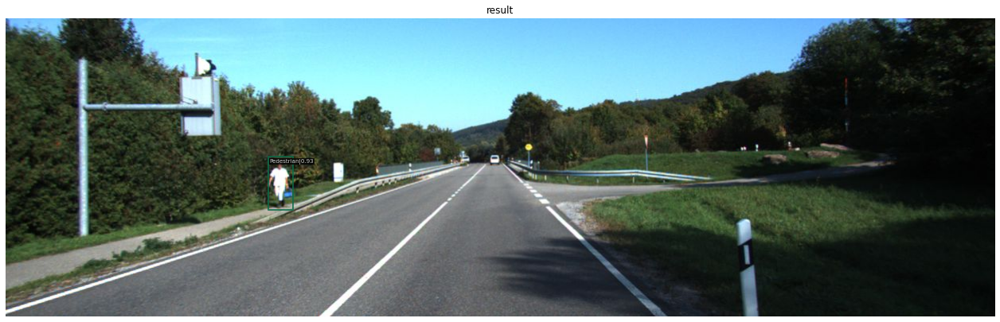

In [ ]:
img = mmcv.imread('kitti_tiny/training/image_2/000005.jpeg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)